In [161]:
# Toggle on-off code text  
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
<input type="submit" value="Click to toggle on/off the raw code.">
</form>''')

<br>
<font size="20"><b><i>Prenatore</i></b></font><br>
<font size="5">Clustering Airbnb Listings in Italian Provinces</font><br>

<center><img src="Venice.png"></center>

# Executive Summary

Italy is agruably one of the most sought-after travel destinations in the entire world. With the advancement of technologies paving the way for services such as Airbnb, people from different corners of the globe can stay at various locations including places as desirable as Italian homes. This study aims to help these travelers in identifying the right Airbnb for them.

Using **$k$-means Representative-Based Clustering**, an optimal clusters of **$k$ = 3** was obtained. Then, the study was able to characterize these clusters according to the chosen features that stood out for each cluster such as **price, reviews, accomodation capacity, and number of bedrooms and beds** To aid classification of new listings, a Gradient Boosting Classifier was employed with a **test accuracy of 99.08%** exceeding the required 1.25 Proportion Chance Criteria score of **63.40%**. 

# Introduction

Airbnb, derived from the phrase “air mattress B&B”, is an online marketplace that connects people in a certain locality who want to rent out their homes with customers who are looking for places to stay for vacation, business trips, etc. (Folger, 2020) Since its humble beginnings in 2008 where it only got less than a hundred bookings, now it is on top of its game in the accommodation booking industry with more than 81,000 cities in 191 countries worldwide.

As much as it is helpful for people looking for accomodations, the platform is equally beneficial for people (referred as hosts) who want to venture in property renting. A way for the latter to attract customers is through putting up a listing. Airbnb currently has more than 6 million listings around the world. A single listing contains a range of information about a particular property for rent, including the size of the space and its amenities, check-in and pricing information, a detailed description of the space, house rules, safety features, and availability. Customers will also see reviews from other guests and information about the hosts. (Rawes et.al, 2019)

## Objective and Metrics

This paper aims to generate clusters using representative-based clustering algorithms of Airbnb listings in Italian provinces (a list will be provided below) based on the chosen metrics:

<img src="Metrics.png">

## Scope and Problem Statements

Using the Airbnb listing data obtain from http://insideairbnb.com/ of the Italian provinces below:
* Bergamo, Lombardia
* Bologna, Emilia-Romagna
* Florence, Toscana
* Milan, Lombardia
* Naples, Campania
* Puglia, Puglia
* Rome, Lazio
* Sicily, Sicilia
* Trentino, Trentino-Alto Adige
* Venice, Veneto

what are the various clusters of Airbnb listings in these Italian provinces? Furthermore, how can these clusters be characterized using select features from the dataset?

# Methodology

<center><img src="Methodology_MP3.jpg"></center>

In [168]:
# Libraries to be used
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

# Data Preparation

## Data Cleaning

In [2]:
df_consolidated = pd.read_csv('listings.csv')

In [3]:
cols = df_consolidated.columns[1:]
df = df_consolidated[cols].dropna().copy(deep = True)

### Overview of the Dataset

In [4]:
df.head()

,id,price,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,minimum_nights,...,room_type,accommodates,bedrooms,beds,bed_type,province,city,street,latitude,longitude
0,15526,82.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,3,...,Entire home/apt,5,2.0,4.0,Real Bed,bergamo,Solto Collina,"Solto Collina, Lombardia, Italy",45.78464,10.02629
1,15542,59.0,98.0,10.0,10.0,10.0,10.0,10.0,10.0,3,...,Entire home/apt,3,1.0,2.0,Real Bed,bergamo,Solto Collina,"Solto Collina, Lombardy, Italy",45.78354,10.02471
2,31412,69.0,96.0,10.0,10.0,9.0,10.0,9.0,9.0,1,...,Entire home/apt,4,1.0,2.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69052,9.67099
3,116423,41.0,95.0,9.0,9.0,10.0,9.0,10.0,10.0,10,...,Entire home/apt,4,2.0,4.0,Real Bed,bergamo,Bossico,"Bossico, Lombardia, Italy",45.82840,10.04476
5,140767,85.0,92.0,9.0,10.0,10.0,10.0,10.0,9.0,2,...,Entire home/apt,4,1.0,4.0,Real Bed,bergamo,Capriate San Gervasio,"Capriate San Gervasio, Lombardy, Italy",45.59565,9.53710


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119000 entries, 0 to 179556
Data columns (total 21 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           119000 non-null  int64  
 1   price                        119000 non-null  float64
 2   review_scores_rating         119000 non-null  float64
 3   review_scores_accuracy       119000 non-null  float64
 4   review_scores_cleanliness    119000 non-null  float64
 5   review_scores_checkin        119000 non-null  float64
 6   review_scores_communication  119000 non-null  float64
 7   review_scores_location       119000 non-null  float64
 8   review_scores_value          119000 non-null  float64
 9   minimum_nights               119000 non-null  int64  
 10  maximum_nights               119000 non-null  int64  
 11  room_type                    119000 non-null  object 
 12  accommodates                 119000 non-null  int64  
 13 

## Data Sampling

### Slovin's Equation

Using Slovin's Equation with a particular margin of error, the required sample sizes are as follows:

In [166]:
N = df.shape[0]

for e in [0.05, 0.04, 0.03, 0.02, 0.01]:
    slovin_result = N/(1+(N * (e**2)))

    print(f'{e} - {int(slovin_result)}')

0.05 - 398
0.04 - 621
0.03 - 1100
0.02 - 2448
0.01 - 9224


With a **margin of error of 1%**, this analysis will use a sample size of approximately **9224**.

### Per Province Sample Size

In [167]:
# Create a dataframe summarizing total number of data points per province
province_count = df.groupby('province').size().reset_index(name = 'counts')

total = province_count.counts.sum()
total_samples = slovin_result


# Calculation of each province's proportion to the total number of data points
province_count['proportion'] = province_count['counts']/total
province_count['sample_size'] = round(province_count['proportion']
                                      *total_samples)


# Perform an initial systematic random sampling with the computed step size
provinces = province_count.province.unique()

df_sampled = pd.DataFrame()
step = int(df.shape[0]/province_count.sample_size.sum())

for p in provinces:
    df_temp = df.loc[df['province'] == p][::step]
    df_sampled = df_sampled.append(df_temp, ignore_index = True)

    
# Determine the number of sampled data points to deduct per province
province_count = province_count.set_index('province')
province_count['deduct'] = (df_sampled.groupby('province').size()
                            - province_count['sample_size'])
province_count

,counts,proportion,sample_size,deduct
province,,,,
bergamo,1821,0.015303,141.0,11.0
bologna,3270,0.027479,253.0,20.0
florence,9805,0.082395,760.0,58.0
milan,14916,0.125345,1156.0,87.0
naples,5631,0.047319,437.0,33.0
puglia,19845,0.166765,1538.0,116.0
rome,23649,0.198731,1833.0,138.0
sicily,31855,0.267689,2469.0,186.0
trentino,890,0.007479,69.0,6.0


### Dataset with Systematic Random Sampling

In [17]:
# Final removal of data points from original data set
df_deduct = pd.DataFrame()

for p in provinces:
    stop = -int(province_count['deduct'][p])
    df_temp = df_sampled.loc[df_sampled['province'] == p][:stop]
    df_deduct = df_deduct.append(df_temp, ignore_index = True)
    
df_sampled = df_deduct.copy(deep = True)

Initial rows of the Sampled Dataset:

In [169]:
df_sampled.head()

,id,price,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,minimum_nights,...,room_type,accommodates,bedrooms,beds,bed_type,province,city,street,latitude,longitude
0,15526,82.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,3,...,Entire home/apt,5,2.0,4.0,Real Bed,bergamo,Solto Collina,"Solto Collina, Lombardia, Italy",45.78464,10.02629
1,321634,49.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,Entire home/apt,2,1.0,1.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69490,9.69000
2,541284,60.0,99.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,Entire home/apt,3,1.0,2.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69989,9.67483
3,663131,52.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,Entire home/apt,5,2.0,5.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.68847,9.65924
4,953122,45.0,96.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,Entire home/apt,5,2.0,3.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69532,9.66026


### Determining Columns of Category Data Type

In [20]:
df_cats = df_sampled.copy(deep = True)
df_cats[['room_type', 'bed_type']] = df_cats[['room_type', 'bed_type']].astype('category')

In [172]:
df_cats.dtypes

id                                int64
price                           float64
review_scores_rating            float64
review_scores_accuracy          float64
review_scores_cleanliness       float64
review_scores_checkin           float64
review_scores_communication     float64
review_scores_location          float64
review_scores_value             float64
minimum_nights                    int64
maximum_nights                    int64
room_type                      category
accommodates                      int64
bedrooms                        float64
beds                            float64
bed_type                       category
province                         object
city                             object
street                           object
latitude                        float64
longitude                       float64
dtype: object

### Translating Category Data Type Values into Category Codes

In [21]:
df_final = df_cats.copy(deep = True)
df_final['room_type'] = df_final['room_type'].cat.codes
df_final['bed_type'] = df_final['bed_type'].cat.codes

In [175]:
df_final.head()

,id,price,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,minimum_nights,...,room_type,accommodates,bedrooms,beds,bed_type,province,city,street,latitude,longitude
0,15526,82.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,3,...,0,5,2.0,4.0,4,bergamo,Solto Collina,"Solto Collina, Lombardia, Italy",45.78464,10.02629
1,321634,49.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,0,2,1.0,1.0,4,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69490,9.69000
2,541284,60.0,99.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,0,3,1.0,2.0,4,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69989,9.67483
3,663131,52.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,0,5,2.0,5.0,4,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.68847,9.65924
4,953122,45.0,96.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,0,5,2.0,3.0,4,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69532,9.66026


In [174]:
df_final.dtypes

id                               int64
price                          float64
review_scores_rating           float64
review_scores_accuracy         float64
review_scores_cleanliness      float64
review_scores_checkin          float64
review_scores_communication    float64
review_scores_location         float64
review_scores_value            float64
minimum_nights                   int64
maximum_nights                   int64
room_type                         int8
accommodates                     int64
bedrooms                       float64
beds                           float64
bed_type                          int8
province                        object
city                            object
street                          object
latitude                       float64
longitude                      float64
dtype: object

# $k$-means Representative-Based Clustering

## Selecting Columns for Clustering

In [22]:
cluster_cols = ['price', 
        'review_scores_rating', 'review_scores_accuracy', 
        'review_scores_cleanliness', 'review_scores_checkin',
        'review_scores_communication', 'review_scores_location',
        'review_scores_value',
        'minimum_nights', 'maximum_nights',
        'room_type', 'accommodates', 'bedrooms', 'beds',
        'bed_type']
df_cluster = df_final[cluster_cols]

In [23]:
df_cluster.dtypes

price                          float64
review_scores_rating           float64
review_scores_accuracy         float64
review_scores_cleanliness      float64
review_scores_checkin          float64
review_scores_communication    float64
review_scores_location         float64
review_scores_value            float64
minimum_nights                   int64
maximum_nights                   int64
room_type                         int8
accommodates                     int64
bedrooms                       float64
beds                           float64
bed_type                          int8
dtype: object

In [24]:
# Libraries Used for Clustering
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.metrics import calinski_harabasz_score, silhouette_score
from IPython.display import HTML
from scipy.spatial.distance import euclidean, cityblock
from sklearn.base import clone
from pyclustering.cluster.kmedians import kmedians
from pyclustering.cluster.kmedoids import kmedoids

In [25]:
# Standard Scaler and Fit Transform
standard_scaler = StandardScaler()
X_listings = standard_scaler.fit_transform(df_cluster)

In [26]:
# Selecting the ideal k
# Pooled with SSD
def pooled_within_ssd(X, y, centroids, dist):
    """Compute pooled within-cluster sum of squares around the cluster mean
    
    Parameters
    ----------
    X : array
        Design matrix with each row corresponding to a point
    y : array
        Class label of each point
    centroids : array
        Number of pairs to sample
    dist : callable
        Distance between two points. It should accept two arrays, each 
        corresponding to the coordinates of each point
        
    Returns
    -------
    float
        Pooled within-cluster sum of squares around the cluster mean
    """
    y = y.astype(int)
    total = np.bincount(y)
    result = 0
    
    for x, y in zip (X, y):
        result += (dist(x, centroids[y])**2/(2*total[y]))
    
    return result

# Gap Statistic
def gap_statistic(X, y, centroids, dist, b, clusterer, random_state=None):
    """Compute the gap statistic
    
    Parameters
    ----------
    X : array
        Design matrix with each row corresponding to a point
    y : array
        Class label of each point
    centroids : array
        Number of pairs to sample
    dist : callable
        Distance between two points. It should accept two arrays, each 
        corresponding to the coordinates of each point
    b : int
        Number of realizations for the reference distribution
    clusterer : KMeans
        Clusterer object that will be used for clustering the reference 
        realizations
    random_state : int, default=None
        Determines random number generation for realizations
        
    Returns
    -------
    gs : float
        Gap statistic
    gs_std : float
        Standard deviation of gap statistic
    """
    rng = np.random.default_rng(random_state)
    
    ssd = np.log(pooled_within_ssd(X, y, centroids, dist))
    stats = np.array([])
    
    for i in range(b):
        X_i = rng.uniform(low = X.min(0), high = X.max(0), size = X.shape)
        y_i = clusterer.fit_predict(X_i)
        ssd_i = np.log(pooled_within_ssd(X_i, y_i,
                                         clusterer.cluster_centers_, dist))
        stats = np.append(stats, (ssd_i - ssd))
        
    return stats.mean(),stats.std()

## Selecting the ideal $k$

In [27]:
# Cluster Range
def cluster_range(X, clusterer, k_start, k_stop, actual=None):
    ys = []
    inertias = []
    chs = []
    scs = []
    gss = []
    gssds = []
    ps = []
    amis = []
    ars = []
    for k in range(k_start, k_stop+1):
        clusterer_k = clone(clusterer)
        clusterer_k.set_params(n_clusters = k)
        y = clusterer_k.fit_predict(X)
        
        ys += [y]
        inertias += [clusterer_k.inertia_]
        chs += [calinski_harabasz_score(X,y)]
        scs += [silhouette_score(X,y)]
        
        if actual is not None:
            ps += [purity(actual, y)]
            amis += [adjusted_mutual_info_score(actual, y)]
            ars += [adjusted_rand_score(actual, y)]
            
        
        gs = gap_statistic(X, y, clusterer_k.cluster_centers_, 
                                 euclidean, 5, 
                                 clone(clusterer).set_params(n_clusters=k), 
                                 random_state=1337)
        
        gss.append(gs[0])
        gssds.append(gs[1])
        
    result = {'ys':ys, 'inertias':inertias, 'chs':chs,
              'gss':gss, 'gssds':gssds, 'scs':scs}
    
    if actual is not None:
        result['ps'] = ps
        result['amis'] = amis
        result['ars'] = ars
        
    return result

# Plot Clusters
def plot_clusters(X, ys):
    """Plot clusters given the design matrix and cluster labels"""
    k_max = len(ys) + 1
    k_mid = k_max//2 + 2
    fig, ax = plt.subplots(2, k_max//2, dpi=150, sharex=True, sharey=True, 
                           figsize=(7,4), subplot_kw=dict(aspect='equal'),
                           gridspec_kw=dict(wspace=0.01))
    for k,y in zip(range(2, k_max+1), ys):
        if k < k_mid:
            ax[0][k%k_mid-2].scatter(*zip(*X), c=y, s=1, alpha=0.8)
            ax[0][k%k_mid-2].set_title('$k=%d$'%k)
        else:
            ax[1][k%k_mid].scatter(*zip(*X), c=y, s=1, alpha=0.8)
            ax[1][k%k_mid].set_title('$k=%d$'%k)
    return ax

def plot_internal(inertias, chs, scs, gss, gssds):
    """Plot internal validation values"""
    fig, ax = plt.subplots()
    ks = np.arange(2, len(inertias)+2)
    ax.plot(ks, inertias, '-o', label='SSE')
    ax.plot(ks, chs, '-ro', label='CH')
    ax.set_xlabel('$k$')
    ax.set_ylabel('SSE/CH')
    lines, labels = ax.get_legend_handles_labels()
    ax2 = ax.twinx()
    ax2.errorbar(ks, gss, gssds, fmt='-go', label='Gap statistic')
    ax2.plot(ks, scs, '-ko', label='Silhouette coefficient')
    ax2.set_ylabel('Gap statistic/Silhouette')
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines+lines2, labels+labels2)
    return ax

In [28]:
res_listings = cluster_range(X_listings, KMeans(random_state=1337), 2, 11)

In [29]:
X_listings_new = PCA(n_components=2, random_state=1337).fit_transform(X_listings)

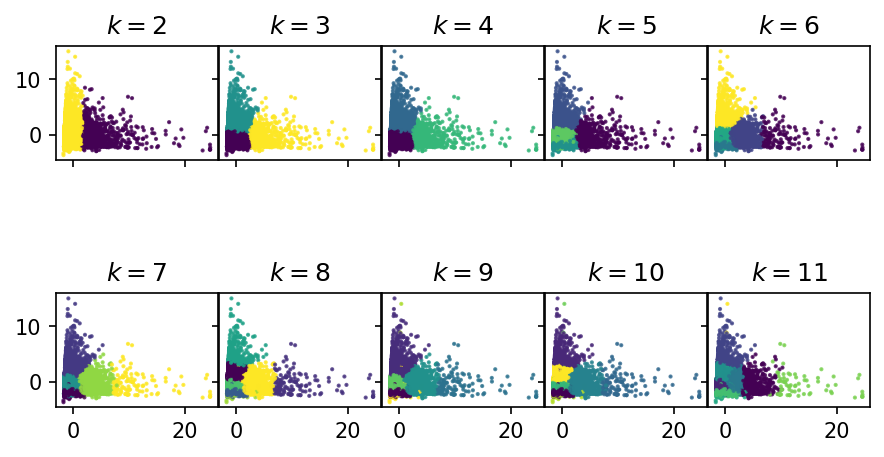

In [30]:
plot_clusters(X_listings_new, res_listings['ys']);

Based on the results of the clustering above, **$k$ = 3** shows the best clustering based on the following criteria: 
* **Compact**: points in the same cluster are close together with the exception of one cluster where there are noticeable outliers
* **Separated**: points within a cluster are clearly separated from other clusters
* **Parsimonious**: with 3 clusters, we minimize the number of clusters while obtaining a meaning interpretation.

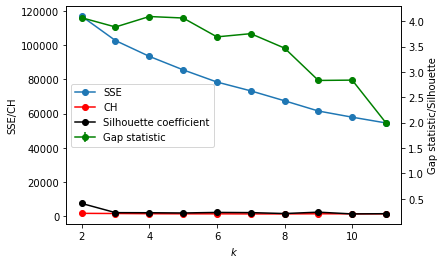

In [177]:
plot_internal(res_listings['inertias'], res_listings['chs'], res_listings['scs'], 
              res_listings['gss'], res_listings['gssds']);

Using the elbow method, the graph above of internal validation criteria show that **$k$ = 3** is indeed the ideal number of clusters. This is supported by the gap statistic where it is the smallest compared the other k's close to three (specifically 2-5 k's) while retaining parsimoniousness.

## Cluster Characterization

Number of data points per cluster:

In [32]:
#Assigning Data points to their respective clusters
listings_c = df_sampled.copy(deep = True)
listings_c['cluster'] = res_listings['ys'][1]

#Number of data points per cluster
listings_c.groupby('cluster').size()

cluster
0    6029
1    2518
2     676
dtype: int64

Datapoints with cluster assignment:

In [33]:
listings_c.head()

,id,price,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,minimum_nights,...,accommodates,bedrooms,beds,bed_type,province,city,street,latitude,longitude,cluster
0,15526,82.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,3,...,5,2.0,4.0,Real Bed,bergamo,Solto Collina,"Solto Collina, Lombardia, Italy",45.78464,10.02629,1
1,321634,49.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,2,1.0,1.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69490,9.69000,0
2,541284,60.0,99.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,3,1.0,2.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69989,9.67483,0
3,663131,52.0,93.0,9.0,10.0,10.0,10.0,9.0,9.0,2,...,5,2.0,5.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.68847,9.65924,1
4,953122,45.0,96.0,10.0,10.0,10.0,10.0,10.0,10.0,2,...,5,2.0,3.0,Real Bed,bergamo,Bergamo,"Bergamo, Lombardy, Italy",45.69532,9.66026,1


# Analyses and Visualizations

## Central Tendency Analyses

In [118]:
cat_cols = ['id','bed_type', 'room_type', 'province', 'street', 'city', 'latitude', 'longitude']
num_cols = [i for i in listings_c.columns.to_list() if i not in cat_cols]

### Mean Analysis

In [35]:
c_mean = pd.DataFrame()
for i in range(3):
    c_mean = c_mean.append(listings_c.loc[listings_c['cluster'] == i].mean(), ignore_index = True)
    
c_mean[num_cols].T

,0,1,2
price,71.878421,132.033757,99.602071
review_scores_rating,95.100680,94.988483,74.494083
review_scores_accuracy,9.756013,9.692216,7.791420
review_scores_cleanliness,9.682700,9.641382,7.821006
review_scores_checkin,9.861337,9.855838,8.383136
review_scores_communication,9.852712,9.843924,8.174556
review_scores_location,9.597943,9.575854,8.397929
review_scores_value,9.501907,9.472200,7.378698
minimum_nights,2.862498,3.247021,3.247041
maximum_nights,587.330071,36333.074265,1031.568047


### Median Analysis

In [36]:
c_med = pd.DataFrame()
for i in range(3):
    c_med = c_med.append(listings_c.loc[listings_c['cluster'] == i].median(), ignore_index = True)
c_med[num_cols].T

,0,1,2
price,60.0,90.0,69.0
review_scores_rating,96.0,96.0,80.0
review_scores_accuracy,10.0,10.0,8.0
review_scores_cleanliness,10.0,10.0,8.0
review_scores_checkin,10.0,10.0,9.0
review_scores_communication,10.0,10.0,8.0
review_scores_location,10.0,10.0,9.0
review_scores_value,10.0,10.0,8.0
minimum_nights,2.0,2.0,2.0
maximum_nights,365.0,365.0,1125.0


### Mode Analysis

In [148]:
type_cols = ['bed_type', 'room_type']
c_mode = pd.DataFrame()
for i in range(3):
    c_mode = c_mode.append(listings_c[type_cols].mode(), ignore_index = True)
c_mode[type_cols].T

,0,1,2
bed_type,Real Bed,Real Bed,Real Bed
room_type,Entire home/apt,Entire home/apt,Entire home/apt


# Cluster Discussion and Interpretation

In [140]:
cluster_0 = listings_c.loc[listings_c['cluster'] == 0]
cluster_1 = listings_c.loc[listings_c['cluster'] == 1]
cluster_2 = listings_c.loc[listings_c['cluster'] == 2]

plot_list = [cluster_0, cluster_1, cluster_2]

In [144]:
plot_num_cols = ['price', 'review_scores_rating', 'accommodates', 'bedrooms', 'beds', 'cluster']

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


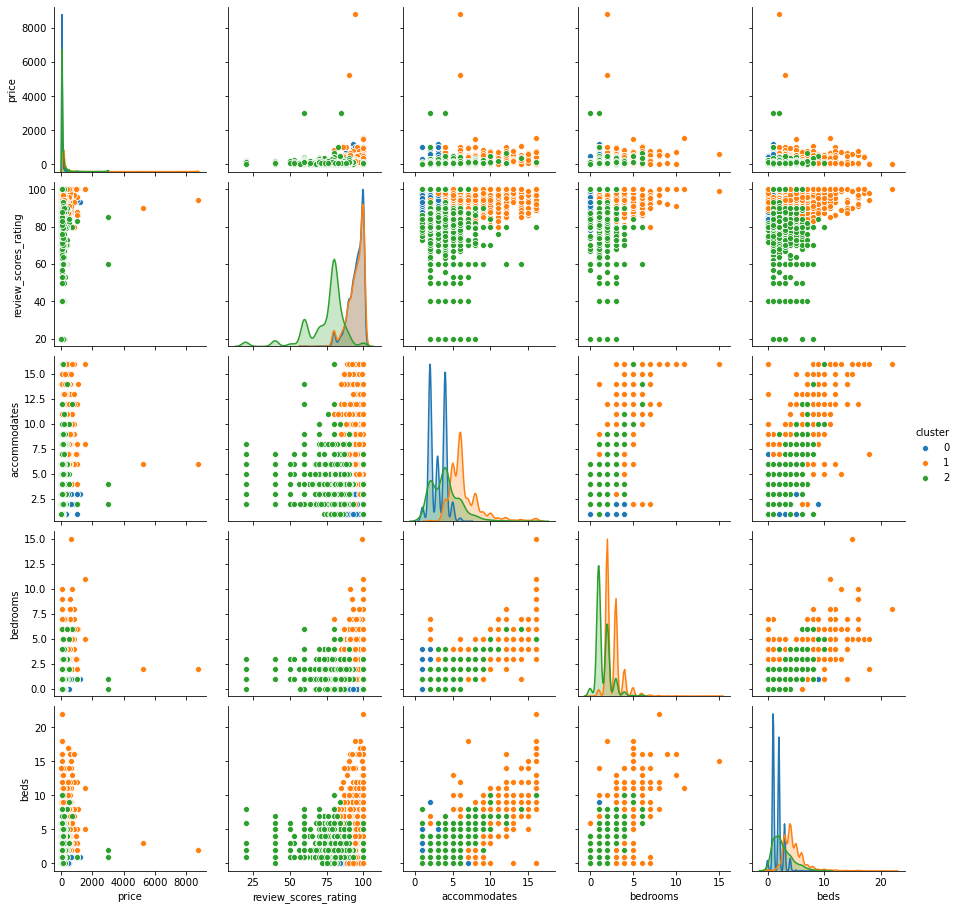

In [145]:
sns.pairplot(listings_c[plot_num_cols], hue = 'cluster')

As shown from the pairplot above, most if not all of the data are:
* discrete (except for `price` and `review_scores_rating`)
* erratic or lacks a defined structure, and
* overlapping

Because we can observe evident outliers, it is recommended to use the **median** values of the clusters for further analysis.



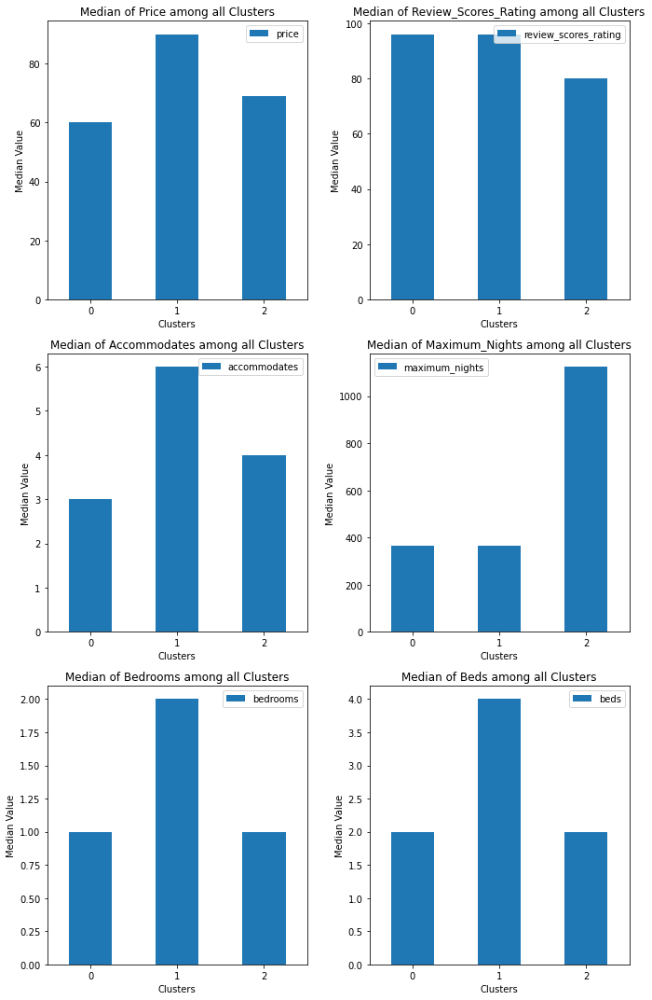

In [65]:
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(10,15))
for col, ax in zip(['price', 'review_scores_rating', 'accommodates', 'maximum_nights', 'bedrooms', 'beds'],
                axes.flatten()):
    ax = (listings_c.groupby(['cluster'], sort=True)
                .median()[col]
                .plot(kind='bar', rot=0, ax=ax,
                title=f'Median of {col.title()} among all Clusters'))
    ax.legend(loc ='best')
    ax.set_ylabel('Median Value')
    ax.set_xlabel('Clusters')
    
plt.tight_layout()

Given the <b>Median Comparative Analysis</b> of identified clusters
via numerical features as shown above, we can interpret and summarize the median values as follows:

| Attribute    | Cluster 0 | Cluster 1 | Cluster 2 |
|:---          |:---       |:---       |:---       |
|Price         |▼          |▲          |◆          |
|Review Scores |▲          |▲          |◆          |
|Accomodates   |▼          |▲          |◆          |
|Max Nights    |▼          |▼          |▲          |
|Bedrooms      |▼          |▲          |▼          |
|Beds          |▼          |▲          |▼          |

<br>

|Legend |   |
|---    |---|
|Low    |▼  |
|Mid    |◆  |
|High   |▲  |


# Listing Classifier

Gradient boosting classifiers are specific types of algorithms that are used for classification tasks, as the name suggests. Features are the inputs that are given to the machine learning algorithm, the inputs that will be used to calculate an output value. (Nelson, n.d.)

In [159]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from collections import Counter

In [153]:
X = df_cluster[cluster_cols]
y = listings_c['cluster']

In [154]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

Gradient Boosting Classifier Accuracy Results:

In [155]:
gbrt = GradientBoostingClassifier(random_state=0,
                                  learning_rate = 0.1,
                                  max_depth = 3,
                                  n_estimators = 100)
gbrt.fit(X_train, y_train)

print("accuracy on training set: %f" % gbrt.score(X_train, y_train))
print("accuracy on test set: %f" % gbrt.score(X_test, y_test))

accuracy on training set: 0.996675
accuracy on test set: 0.990893


In [157]:
def PCC_calculator(target, target_name=[], dataset_name='given', graph=True):
    """Returns the Proportion Chance Criteria (PCC) of a dataset's 
    target labels.
 
    Parameter
    ---------
    target : 1-D np.array or  pd.Series or list
        Countable list of targets. This will be passed through the Counter 
    function. 
 
    target_name : list of strings
        Numerical or non-numerical labels for the targets to be used as labels
    of the xtickmarks of the graph
 
    dataset_name : string
        Name of the dataset to be used in the graph/ visualization
    
    graph : Bool
        If `True` a frequency graph of the targets will be shown
    
    Return
    ------
    PCC : Float
        1.25PCC value of the target
    """
    target_count = Counter(target)
    
    df_target_count = pd.DataFrame.from_dict(target_count, 
                                            orient='index', 
                                            columns=['n_i'])
                                            
    PCC = ((df_target_count.n_i/ df_target_count.n_i.sum())**2).sum()*1.25*100
 
    if not any(target_name):
        target_name = df_target_count.index.to_list()
 
    if graph: 
        ax = df_target_count.plot(kind='bar', rot=0, figsize=(7,7))
        ax.get_legend().remove()
        ax.set_ylabel('Frequency of each target')
        ax.set_xlabel(f'Target labels of the {dataset_name} Dataset')
        ax.set_title(f'"Targets" Distribution of the {dataset_name} Dataset\n'
                     f'(1.25PCC = {PCC:0.2f}%)')
        ax.set_xticklabels(target_name)
 
    return PCC

63.40267101387009

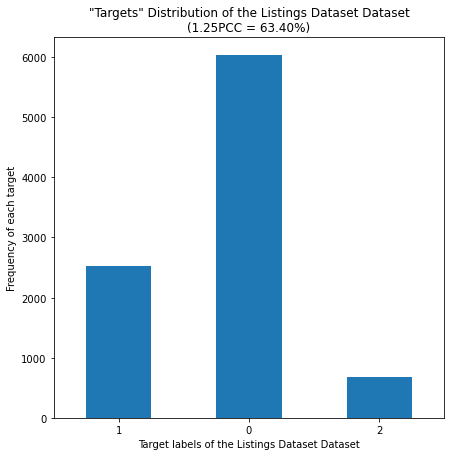

In [160]:
PCC_calculator(y, target_name = y.unique(), dataset_name = 'Listings Dataset', graph = True)

Using the 3 clusters produced by the k-means clustering method, we implemented a Gradient Boosted Classifier that will classify any new listing to a particular cluster among those 3. This Gradient Boosted Classifier obtained an accuracy on the training set of **99.66%** and on the test set of **99.08%**. With the accuracies of the Gradient Boosted Classifier exceeding the 1.25PCC score of **63.40%**, the model is **reliable** in predicting the clusters we want for any listing in Italy.

## Cluster Mapping

*Note: You may zoom in or out of the map below. You may also click any of the datapoints to get an overview of each listing (Province, City, Street, Listing ID).*

In [114]:
listings_clustered = listings_c
italy_map = folium.Map(location=[41.8719, 12.5674], zoom_start=6)
for i in range(len(listings_clustered)):
    
    if listings_clustered['cluster'][i] == 0:  
        folium.RegularPolygonMarker([listings_clustered.iloc[i]['latitude'], listings_clustered.iloc[i]['longitude']],
                                number_of_sides=3, rotation=30, 
                                fill_color='blue', fill_opacity = 1, 
                                color='blue', radius = 10, 
                                popup="Province: {}\n City: {}\n"
                               "Street: {}\n Listing ID: {}\n".format(
                                   listings_clustered.iloc[i]['province'], 
                                   listings_clustered.iloc[i]['city'],
                                   listings_clustered.iloc[i]['street'],
                                   listings_clustered.iloc[i]['id'])).add_to(italy_map)
        
    elif listings_clustered['cluster'][i] == 1:  
        folium.RegularPolygonMarker([listings_clustered.iloc[i]['latitude'], listings_clustered.iloc[i]['longitude']],
                                number_of_sides=4, rotation=30, 
                                fill_color='orange', fill_opacity = 1, 
                                color='orange', radius = 10, 
                                popup="Province: {}\n City: {}\n"
                               "Street: {}\n Listing ID: {}\n".format(
                                   listings_clustered.iloc[i]['province'], 
                                   listings_clustered.iloc[i]['city'],
                                   listings_clustered.iloc[i]['street'],
                                   listings_clustered.iloc[i]['id'])).add_to(italy_map)
        
    else:
        folium.RegularPolygonMarker([listings_clustered.iloc[i]['latitude'], listings_clustered.iloc[i]['longitude']],
                                number_of_sides=5, rotation=30, 
                                fill_color='green', fill_opacity = 1, 
                                color='green', radius = 10, 
                                popup="Province: {}\n City: {}\n"
                               "Street: {}\n Listing ID: {}\n".format(
                                   listings_clustered.iloc[i]['province'], 
                                   listings_clustered.iloc[i]['city'],
                                   listings_clustered.iloc[i]['street'],
                                   listings_clustered.iloc[i]['id'])).add_to(italy_map)
italy_map

|Legend| |
|:---|:---|
|<font color="blue" size="6">▲</font>|Cluster 0|
|<font color="orange" size="10">■</font>|Cluster 1|
|<font color="green" size="6">⬟</font>|Cluster 2|

# Conclusions and Recommendations

**Cluster 0**: ***Il Compagno Economico Grappolo*** (The Economy Companion Cluster) <br>
This cluster is preferred for groups of 2 or 3 such as couples on their Italian honeymoon or for small families celebrating their first out-of-country trip. These listings accommodate a few persons for the cheapest prices with the best review scores tied with La Ressa Costoso Grappolo.

**Cluster 1**: ***La Ressa Costoso Grappolo*** (The Exclusive Crowd Cluster)<br> 
This cluster of listings is preferred for large groups of families or friends being able to accomodate about 6 persons and having the most amount of bedrooms and beds. Boasting good reviews at par with Il Compagno Economico, these listings are guaranteed to provide an excellent experience for all.

**Cluster 2**: ***Il Gruppo Modico Grappolo*** (The Moderate Bunch Cluster)<br>
If a small group of friends would like to experience Italy for a lesser price compared to La Ressa Costoso Grappolo, this cluster of listings is the best options for them. While they have to expect a modest experience compared to the other clusters with its review scores, this group of friends will definitely experience more bonding time with an amount of bedrooms and beds comparable to Il Compagno Economico Grappolo.

With the mode of the categorical data types as shown in the mode analysis above, we can be certain that for almost any listing a person books for in Italy, he will end up staying in an entire home or apartment and sleeping in a real bed.

# References

* Airbnb (2020). What does the room type of a listing mean? Retrieved from: https://www.airbnb.com/help/article/5/what-does-the-room-type-of-a-listing-mean
* Airbnb (2020). How do star ratings work for stays? Retrieved from: https://www.airbnb.com/help/article/1257/how-do-star-ratings-work-for-stays
* Folger, J. (2020). Airbnb: Advantages and Disadvantages. Retrieved from: https://www.investopedia.com/articles/personal-finance/032814/pros-and-cons-using-airbnb.asp.
* Nelson, D. (n.d.). Gradient Boosting Classifiers in Python with Scikit-Learn. Retrieved from: https://stackabuse.com/gradient-boosting-classifiers-in-python-with-scikit-learn/
* Rawes, E. and Coomes, K., (2019). What is AirBnb? What to know before becoming a guest or host. Retrieved from: https://www.digitaltrends.com/home/what-is-airbnb/
